## Preliminary imports

Each used package must be imported into a notebook manually.

Here, we will import `matplotlib` for plotting, `numpy` for basic numerics, and the imaging package `hcr_imaging` (aliased as `im`) for image-related functionality.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import hcr_imaging as im

It is useful to set up some sensible defaults for image display, including color palettes, styling, and to enable the `bokeh` Python package to output images into the notebook in an inline fashion.

This is done with the `configure_notebook()` function.

In [2]:
im.configure_notebook()

Loading BokehJS ...

## Loading the image

Next, we will load the image to analyze using the `load()` function. Supported file formats include `.czi`, `.lif`, and `.tif`.

For additional formats, or for help analyzing a file you have with different formatting conventions, contact our support and attach an example image that you want to analyze.

Generally speaking, raw image data is loaded as an `xarray.DataArray` with suitable `xyz` dimensions and coordinates. 

`l` is used along with `x`, `y`, and `z` as an abbreviation to index wavelength or channel.

The file name of the input image is specified here. You may need to supply the directory path in this name if the input image is not in the current working directory.

In [3]:
lif = im.load('dHCR-10-plex.lif')

A `.lif` file may contain multiple images, so the one to analyze must be selected.

In [4]:
print('Images in lif file:')
for i, l in enumerate(lif):
    print('%3d: %r' % (i, l))

Images in lif file:
  0: '10plex-rep1'
  1: 'FrameProperties'
  2: '10plex-rep2'
  3: '10plex-rep3'
  4: '405'
  5: '425'
  6: '488'
  7: '514'
  8: '546'
  9: '594'
 10: '633'
 11: '700'
 12: '750'
 13: '800'
 14: 'autofluorescence'
 15: '10plex-rep1_DyeSep001'
 16: '10plex-rep2_DyeSep001'
 17: '10plex-rep3_DyeSep001'


We will select the `'10plex-rep2_DyeSep001'` image from this `.lif` file like so:

In [5]:
image_name = '10plex-rep2_DyeSep001'
img = im.open_lif_series(lif[image_name], name=image_name)

Normally the files are assumed to contain dimensions `xylz` or `xyl` (in any order).

Recall that we use `l` to signify the wavelength or channel dimension.

In [6]:
print('Image dimensions =', dict(zip(img.dims, img.shape)))
print('Image data type =', img.dtype)

Image dimensions = {'x': 1024, 'y': 256, 'l': 11, 'z': 45}
Image data type = uint16


Dot detection is performed independently for each channel.

Often we only want to analyze a subset of the channels in an image.

We can select this subset using standard Python indexing *which starts at 0*.

For this image we only want the fourth and seventh channels, so we select with `l=[3, 6]`. For just the first two channels, for example, you could switch to `l=[0, 1]`.

In our case, we analyzed only z-sections 37-41 (1-indexed and inclusive), so we also slice these out using Python indexing `slice(36, 41)` (recall again that Python ranges start at 0 and are exclusive of the right-hand limit).

The following code also ensures that the image has a leading channel dimension and is in floating point format, which is necessary for the convolutions run later.

In [7]:
channels = img.transpose(*'lzxy').isel(l=[3, 6], z=slice(36, 41)).astype(np.float32)

## Basic image analyis

There is a lot of plotting functionality, including interactive plotting. (You may also use standard routines from `bokeh` or `matplotlib` as you prefer.)

For interactive plotting, we start with a blank figure and then draw on top of it.

Here we can plot our input image using `bokeh` and the `show_channels()` function. Optionally, we can max-z project beforehand (which is useful for very large images).

The `show_channels()` function returns a GUI element of sliders. We can display the sliders and image together using the `gui.disp()`  function, which is a thin wrapper over standard `bokeh` plotting.

A menu allows you to choose the plotted channel, and a slider allows to choose the maximum intensity at which a pixel will show up as saturated (completely white).

In [8]:
p = im.figure('dark', shape=(600, 600), title='channels')
max_z = True
sliders = im.gui.show_channels(p, im.max_z(channels) if max_z else channels)
im.gui.disp(im.gui.column(*sliders, p))

We can also very easily generate pixel intensity histograms. Sometimes this is useful, though it is often not -- it depends on the nature of your image and noise properties.

Here we will show the pixel intensity histograms using basic `matplotlib` plotting. Recall that our images are `xarray.DataArray` objects, which are roughly like annotated versions of `numpy` `ndarray`s.
Thus we can plug them into any functions which expect `numpy` arrays.
(You may explicitly retrieve an equivalent `numpy` array using the `.values` member of an `xarray.DataArray`.)

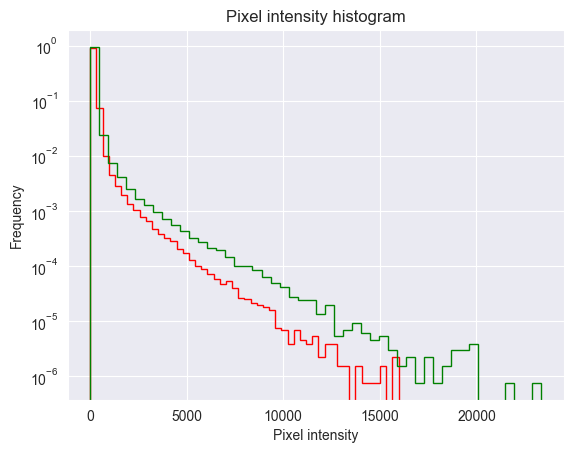

In [9]:
for c, k in zip(channels, 'rgb'):
    im.hist(plt, c, bins=50, color=k)

# plt.xlim(0, 65535) # you can set the x axis limits like this if desired
plt.title('Pixel intensity histogram')
plt.xlabel('Pixel intensity')
plt.ylabel('Frequency')
plt.yscale('log')
# plt.savefig(img.name + ' pixels.pdf') # you can save the plot as a PDF like this

## Running dot detection

Next we'll run dot detection on each image.
The dot detection has some parameters, most of which don't need to be adjusted normally.
You can use the `help()` function to display the relevant parameters and defaults.

In [10]:
help(im.detect_dots)

Help on function detect_dots in module hcr_imaging.dots:

detect_dots(image, max_dots, hi_pass=0.5, sigma=0.2, hi_pass_factor=1, hi_pass_threshold=None, *, limit_radii=None, agglomerate=False, max_maxima=1000000, allow_edges=True, optimize='center', lo_pass=0, gaussian=None, weight_sigma=None, min_ratio=1, dtype=<class 'numpy.float32'>)
    Detect dots in a given image.
    If first argument is a tuple, evaluate in parallel for each item in the tuple

    - `max_dots` (int): maximum number of dots to consider
    - `lo_pass` (float/array): lengthscale less than the dot width (in microns)
    - `hi_pass` (float/array): lengthscale greater than the dot width (in microns)
    - `sigma` (float/array): expected dot width (in microns)
    - `hi_pass_factor` (float): remove features larger than the high pass lengthscale by a factor of this number
    - `hi_pass_threshold` (float): after removing high pass features, zero any pixels below this threshold if given
    - `limit_radii` (float/array

Here we will run the dot detection for each channel in parallel. To run a single channel, the first argument may be specified as a single channel image rather than the `tuple` below.

The following settings match those used in generating our publication data. The customized detection settings reflect:

- The `max_dots` parameter was chosen as 2000 as a weak upper bound on the number of dots in each channel.
- The `lo_pass` parameter was set at 0 microns, meaning that no Gaussian blur of the initial image was applied.
- The `hi_pass` parameter was set at 40 microns, meaning that features above this lengthscale were removed by subtracting a blurred image from the original image.
- The `sigma` parameter was set at 0.3 microns, reflecting the approximate expected dot radius due to diffraction and resolution limitations.
- The `min_ratio` setting was set at 2. Let `x` be the minimum separation at which two idealized Gaussian dots in the same channel yield a single maximum in the determinant of Hessian filter. Then here, detection of dots closer than 2 times `x` in the same channel is prevented (by excluding the weaker intensity dot). This is equivalent to a minimum separation of about 0.94 microns for our chosen `sigma`.

In [11]:
results = im.detect_dots(tuple(channels), max_dots=2000, lo_pass=0, hi_pass=40, sigma=0.3, min_ratio=2, agglomerate=False)

The `results` object is a list of result dictionaries for each channel. A dictionary contains keys like `centers` and `weights`.
The `weights` are the dot weights that have been optimized, while the `centers` are the optimized dot centers.

We can easily plot histograms of the detected dot weights (with the first channel in `'g'`, red, and the second in `'r'`, green) using `matplotlib`:

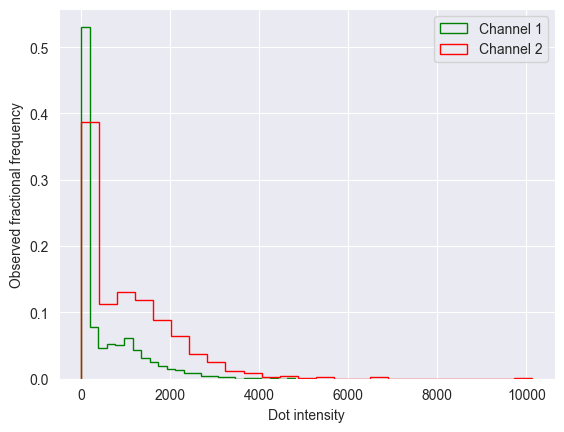

In [12]:
for i, (r, color) in enumerate(zip(results, 'gr')):
    im.hist(plt, r['weights'], bins=25, color=color, label='Channel ' + str(i+1))
plt.legend()
plt.xlabel('Dot intensity')
plt.ylabel('Observed fractional frequency');

It is easy to print or save CSVs for the dots determined from each channel:

In [13]:
print('Detected dots in each channel:')
for i, r in enumerate(results):
    # r['dots'].to_csv('%s dots %d.csv' % (img.name, i)) # To save a CSV of all candidate dots determined, uncomment this line
    w = r['weights']
    print('    Channel %d: %d dots (mean=%.2f, median=%.2f, min=%.2f, max=%.2f)' % (i, len(w), w.mean(), np.median(w), w.min(), w.max()))

Detected dots in each channel:
    Channel 0: 1509 dots (mean=543.07, median=151.14, min=0.10, max=4806.15)
    Channel 1: 1002 dots (mean=1041.01, median=810.73, min=0.15, max=10126.29)


## Thresholding and result display

Next, threshold the dots below your chosen thresholds until you are satisfied that the threshold discriminates roughly between your signal and background.

Manually set your thresholds here. There is one threshold per channel. You can rerun over and over until your result is as desired.

The thresholds are drawn as vertical lines below on top of the dot intensity distributions. We have found it useful to look at dot intensities both in linear and log scale, so both are plotted here.

Number of thresholded dots = 666 (mean=1.16e+03)
Number of thresholded dots = 644 (mean=1.57e+03)


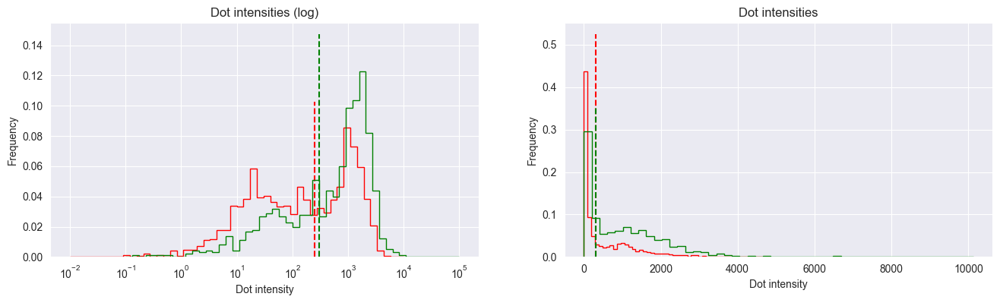

In [14]:
thresholds = [250, 300] # Change these numbers depending on the characteristics of your image and detected dot distributions

weights = [r['weights'] for r in results]
fig, (p, q) = plt.subplots(1, 2, figsize=(16, 4))

p.set_title('Dot intensities (log)')
for w, t, k in zip(weights, thresholds, 'rgb'):
    plotted = im.hist(p, w, bins=im.common.log_bins(w, 50), color=k)
    p.plot([t, t], [0, 1.2 * plotted[0].max()], color=k, linestyle='--')

p.set_xscale('log')

q.set_title('Dot intensities')
for w, k in zip(weights, 'rgb'):
    plotted = im.hist(q, w, bins=50, color=k)
    q.plot([t, t], [0, 1.2 * plotted[0].max()], color=k, linestyle='--')
    
def cutoff(r, thresh):
    ok = r['weights'] > thresh
    print('Number of thresholded dots = %d (mean=%.2e)' % (ok.sum(), r['weights'][ok].mean()))
    return r['centers'][ok], r['weights'][ok]

for a in (p, q):
    a.set_xlabel('Dot intensity')
    a.set_ylabel('Frequency')

# plt.savefig('%s thresholded histograms.pdf' % img.name) # To save this figure as a PDF, uncomment this line
centers, weights = zip(*[cutoff(r, t) for r, t in zip(results, thresholds)])

Next, we can plot the detected dots on top of the original images.

This is done individually for the dots of each channel below:

In [15]:
for i, (c, w, x) in enumerate(zip(channels, weights, centers)):
    print('Number of thresholded dots = %d' % len(w))
    p = im.figure('dark', shape=(700, 700), title='Channel %d' % i)
    sliders = im.gui.show_channels(p, [im.max_z(c)])

    xy = [c.dims.index('y'), c.dims.index('x')] # You may have to change this to make sure the output image is not transposed
    im.circles(p, x[:, xy], radius=0.5, color='yellow', alpha=1, line_width=1)

    # im.save_figure(p, img.name + ' circles.svg') # Uncomment this to save an svg
    im.gui.disp(im.gui.column(*sliders, p))

Number of thresholded dots = 666


Number of thresholded dots = 644


Finally, for cases where there are two channels, we can do a dot colocalization analysis.

This is done using given distance thresholds (typically in microns).

The `partitions()` function returns the indices and positions of (1) the colocalized dots, (2) the dots only in the first channel, and (3) the dots only in the second channel.

Here the threshold is `{'xy': 0.5, 'z': 1.0}`, meaning that two dots are colocalized if they are within 0.5 microns in the `xy` plane and 1 micron in the `z` axis.

Here we will plot the dots only in the first channel as red, those only in the second channel as green, and the colocalized dots as yellow.

In [16]:
if len(results) == 2:
    coloc, iso0, iso1 = im.partitions(centers, weights, thresholds={'xy': 0.5, 'z': 1.0})

    print('Number of dots in each channel =', [len(w) for w in weights])
    print('Number of colocalized dots =', len(coloc[0]))
    print('Number of uncolocalized dots =', [len(i[0]) for i in (iso0, iso1)])
    print('Colocalization fractions =', ', '.join(['%.3f' % (len(coloc[0]) / len(w)) for w in weights]))

    p = im.figure('dark', shape=(700, 700), title='Colocalization')
    sliders = im.gui.show_xy(p, channels.max('z').transpose(*'lxy'))

    xy = [channels[0].dims.index('y'), channels[0].dims.index('x')]
    im.circles(p, coloc[0][:, xy], radius=0.5, color='yellow', alpha=1, line_width=1)
    im.circles(p, iso0[0][:, xy], radius=0.5, color='green', alpha=1, line_width=1)
    im.circles(p, iso1[0][:, xy], radius=0.5, color='red', alpha=1, line_width=1)

    # im.save_figure(p, img.name + ' circles.svg') # To save SVG, uncomment this line
    im.gui.disp(im.gui.column(*sliders, p))

Number of dots in each channel = [666, 644]
Number of colocalized dots = 538
Number of uncolocalized dots = [128, 111]
Colocalization fractions = 0.808, 0.835
